# Where the Water Flows -- Glacier de Bonne Pierre

In [1]:
using Pkg; Pkg.activate("/scratch-1/cogier/hydraulic_barriers/")
Pkg.resolve()
using Rasters
using Shapefile
using WhereTheWaterFlowsSubglacially, WhereTheWaterFlows
const WWFS = WhereTheWaterFlowsSubglacially
const WWF = WhereTheWaterFlows
using ArchGDAL
#using MAT
using Plots
using GlacioTools
include("/scratch-3/cogier/GlacioTools.jl/src/Rasters_helpers.jl")
#using GLMakie
#Pkg.status()
#include("/scratch-3/cogier/WhereTheWaterFlowsSubglacially.jl/src/helpers.jl")
using CSV
using DataFrames
using GeoStats
using Images
using ImageComponentAnalysis


  Activating project at `/scratch-1/cogier/hydraulic_barriers`
  No Changes to `/scratch-1/cogier/hydraulic_barriers/Project.toml`
  No Changes to `/scratch-1/cogier/hydraulic_barriers/Manifest.toml`


In [2]:
datadir_in = "/scratch-3/cogier/data/DEM_input"
datadir_out = "/scratch-3/cogier/data/DEM_output"


"/scratch-3/cogier/data/DEM_output"

### Import Ice thickness ###

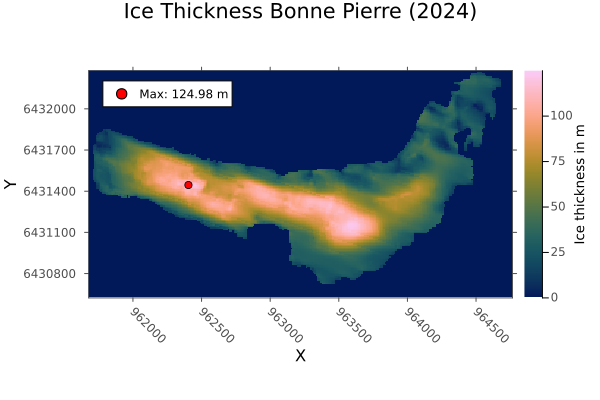

In [3]:
# Bonne Pierreice thickness 2024
ice_thickness_2024 = Raster(joinpath(datadir_in,"IceThickness.tif"));
ice_thickness_2024[ice_thickness_2024 .< 0] .= 0

# Find max value and its index
max_value = maximum(ice_thickness_2024)
max_index = argmax(ice_thickness_2024)  # Returns linear index
x,y = dims(ice_thickness_2024)
x_max, y_max = x[max_index[1]],y[max_index[2]]

Plots.heatmap(ice_thickness_2024,title="Ice Thickness Bonne Pierre (2024)",colorbar_title="Ice thickness in m") 
scatter!([x_max],[y_max], color=:red, markersize=4,label="Max: $(round(max_value, digits=2)) m")

### Import Bed ###

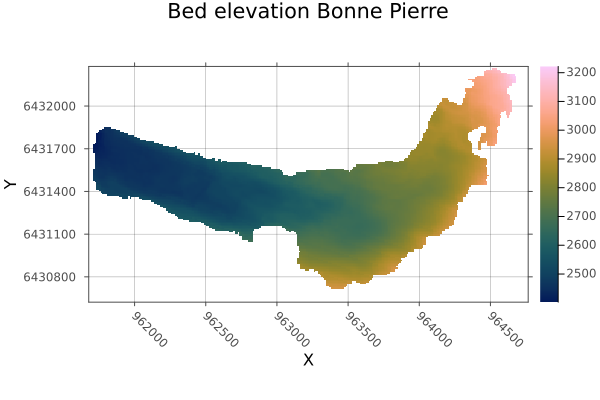

In [4]:
# Bonne Pierre bed
bed = Raster(joinpath(datadir_in, "Bedrock.tif"))
bed[bed .< 0] .= NaN # -9999 values
Plots.heatmap(bed,title="Bed elevation Bonne Pierre")
#Plots.contour!(mask, color=:black,levels=[0.5])  







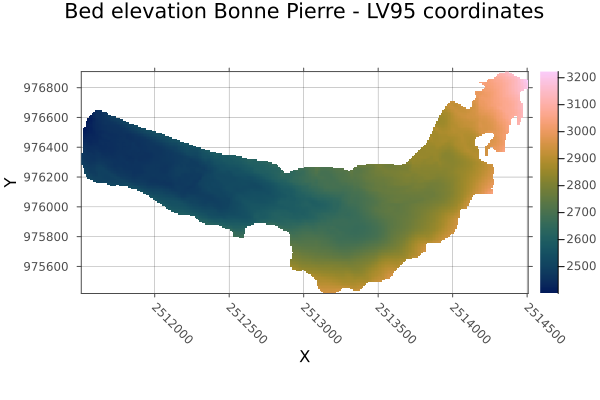

In [5]:
bed_swiss = Raster(joinpath(datadir_in, "grid_bedrock_10m.tif"))
crs(bed_swiss)
Plots.heatmap(bed_swiss,title="Bed elevation Bonne Pierre - LV95 coordinates")



### Import Surface (crop and resample bed) ###

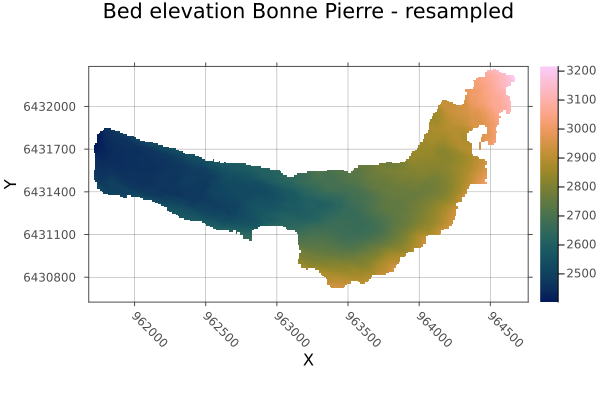

In [6]:
# surface_2021 
all_surface_2021 = Raster(joinpath(datadir_in,"Berarde_Res1.0_CompElevmean_merged.tif"));

#crop surface 2021
surface_2021_cr = crop(all_surface_2021; to=bed)
surface_2021_cr[surface_2021_cr .< 0] .= NaN

# resample bed and ice_thickness
bed_resamp = resample(bed; to=surface_2021_cr,method=:bilinear)  #the use of bilinear instead of nearest change quite a bit. bilinear smooth the transition, nearest does not
#note also that bilinear snooth the weird pattern in bed original (after transformation from LV95 to Lambert93)
mask = bed_resamp.> 0
#bed_resamp = resample(bed; to=surface_2021_cr, extent=extent(bed))
#bed_resamp[bed_resamp .< 0] .= NaN # -9999 values
ice_thickness_2024_resamp = resample(ice_thickness_2024; to=surface_2021_cr,method=:bilinear)

#Plot
Plots.heatmap(surface_2021_cr,title="surface elevation 2021 catchement Bonne Pierre")
contour!(mask, color=:black,levels=[0.5],title="surface elevation 2021 catchement Bonne Pierre")  
heatmap(bed_resamp,title="Bed elevation Bonne Pierre - resampled")



In [7]:
step(dims(surface_2021_cr)[1])


1.0

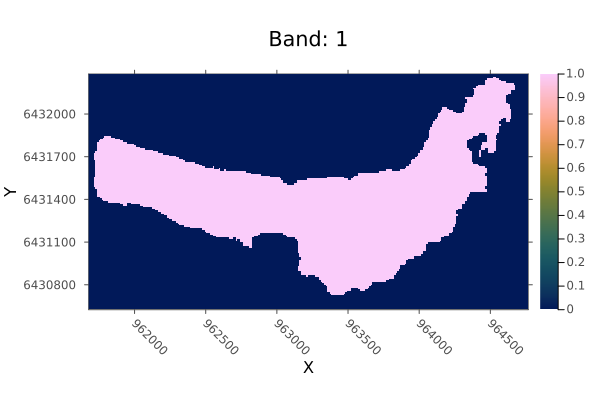

In [8]:
heatmap(mask)

In [9]:
dims(bed_resamp) == dims(surface_2021_cr)


true

### Calculate ice thickness 2021 ###

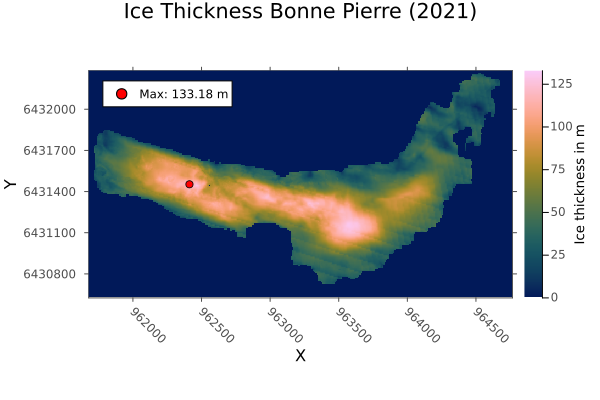

In [10]:
# Ice Thickness 2021

ice_thickness_2021 = surface_2021_cr .- bed_resamp
ice_thickness_2021[isnan.(ice_thickness_2021)] .= 0
ice_thickness_2021[ice_thickness_2021 .< 0] .= 0

# Find max value and its index
max_value = maximum(ice_thickness_2021)
max_index = argmax(ice_thickness_2021)  # Returns linear index
x,y = dims(ice_thickness_2021)
x_max, y_max = x[max_index[1]],y[max_index[2]]

Plots.heatmap(ice_thickness_2021,title="Ice Thickness Bonne Pierre (2021)",colorbar_title="Ice thickness in m") 
scatter!([x_max],[y_max], color=:red, markersize=4,label="Max: $(round(max_value, digits=2)) m")



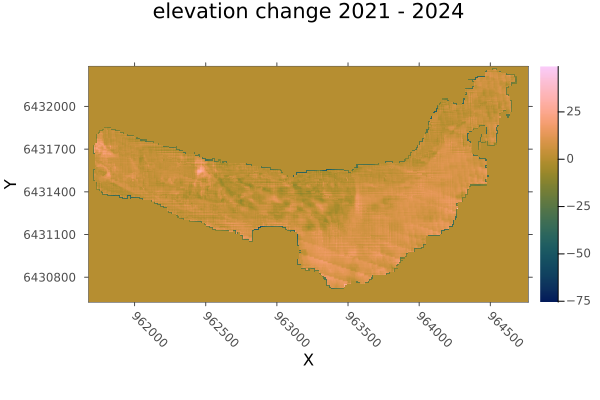

In [11]:
# diff 2024 - 2021
ice_thickness_2024 = resample(ice_thickness_2024; to=ice_thickness_2021)
ice_thickness_diff = ice_thickness_2021 .- ice_thickness_2024

heatmap(ice_thickness_diff,title="elevation change 2021 - 2024")

In [12]:
# Glacier free landscape
#ice_free_surface_2021 = mosaic(first,bed_resamp,surface_2021_cr;missingval)
#Plots.heatmap(ice_free_surface_2021,title="Ice free surface elevation 2021 catchement Bonne Pierre")
#contour!(mask, color=:black,levels=[0.5],title="Ice free surface elevation 2021 catchement Bonne Pierre")  


In [13]:
dims(surface_2021_cr) == dims(ice_thickness_2021)

true

In [14]:
# Use mosaic to replace valid values of `bed` into `surface_2021_cr`
combined = mosaic(first, bed_resamp, surface_2021_cr)
heatmap(combined)

LoadError: UndefVarError: `mosaic` not defined in `Main`
Hint: It looks like two or more modules export different bindings with this name, resulting in ambiguity. Try explicitly importing it from a particular module, or qualifying the name with the module it should come from.
Hint: a global variable of this name also exists in Rasters.
Hint: a global variable of this name also exists in MosaicViews.
Hint: a global variable of this name also exists in ImageCore.
Hint: a global variable of this name also exists in ImageBase.
Hint: a global variable of this name also exists in ImageAxes.
Hint: a global variable of this name also exists in Images.

In [ ]:
dims(surface_2021_cr)

X Projected{Float64} LinRange{Float64}(961678.0, 964764.0, 3087) ForwardOrdered Regular Intervals{Start} crs: WellKnownText,
Y Projected{Float64} LinRange{Float64}(6.43228e6, 6.43062e6, 1655) ReverseOrdered Regular Intervals{Start} crs: WellKnownText

### Smooth surface ###

In [ ]:
###

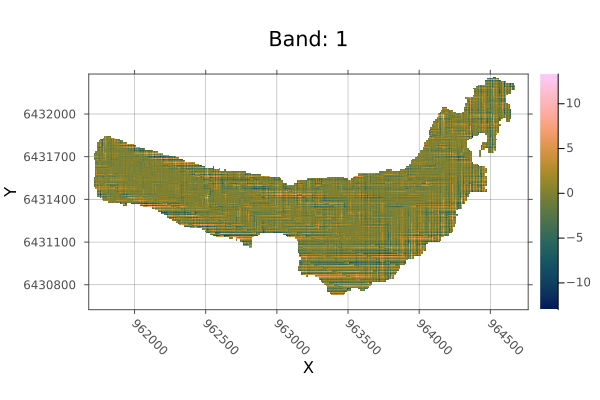

In [15]:
bed_resamp_bilinear = resample(bed; to=surface_2021_cr,method=:bilinear)  
bed_resamp_near = resample(bed; to=surface_2021_cr,method=:nearest)  
heatmap(bed_resamp_bilinear .- bed_resamp_near)

### Sensitivity test of smooth surface in subglacial lake volume ###

In [ ]:


# Define parameters
x, y = dims(surface_2021_cr)
y = x  # Trick to satisfy WWFS.smooth_surface dx=dy requirements (because dy = -1, and dx = 1)
dx = step(dims(surface_2021_cr)[1])
ice_fractions = 0:0.05:0.5  # Ice fraction from 0 to 0.5 in increments of 0.05 : spatially adaptive smoothing length
minwindow = 20  # Minimal smoothing window
results = DataFrame(ice_fraction=Float64[], max_ice_thickness=Float64[], sum_lake=Float64[], sum_lake_inf1m=Float64[], sum_lake_inf50cm=Float64[], number_lakes=Float64[])
mask = bed_resamp.> 0
lakes_free_surf = 0 # initiation

# Iterate over ice fractions
for ice_fraction in ice_fractions
    # Smooth the surface
    surface_2021_smooth = WWFS.smooth_surface(x, y, surface_2021_cr, bed_resamp, ice_fraction, mask)

    #The smoothing window is defined as twice the product of the ice_fraction and the local ice thickness, with a minimal window size (minwindow) added.

    # Compute ice thickness
    ice_thickness_2021_smooth = surface_2021_smooth .- bed_resamp

    # Find max ice thickness and location
    max_value = maximum(ice_thickness_2021_smooth[.!isnan.(lakes_free_surf) .&& mask])


    # Compute WWFS and extract lake surface
    (_, _, _, _, _, _, _, _), (_, _, _, _), (_, lakes_free_surf), _ = 
        WWFS.waterflows_subglacial(surface_2021_smooth, surface_2021_cr .- ice_thickness_2021, 
                                   dx, gamma=[0, WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true)

    # Compute sum of lake surface within mask
    sum_lake = sum(lakes_free_surf[.!isnan.(lakes_free_surf) .&& mask]) * dx * dx # times the pixel area in m2 to get the volume in m3
    # Compute cumulative volume of cells having water depth >0 and <2m (a proxy)
    sum_lake_inf1m = sum(lakes_free_surf[.!isnan.(lakes_free_surf) .&& (lakes_free_surf .> 0) .&& (lakes_free_surf .< 1) .&& mask]) * (dx * dx) # times the pixel area in m² to get the volume in m³
    sum_lake_inf50cm = sum(lakes_free_surf[.!isnan.(lakes_free_surf) .&& (lakes_free_surf .> 0) .&& (lakes_free_surf .< 0.5) .&& mask]) * (dx * dx) # in m3
    # number of lakes
    mask_lakes = (lakes_free_surf .> 0) .& (mask .> 0) # mask for bollean
    labeled_image = Images.label_components(mask_lakes)
    number_lakes = maximum(labeled_image)


    # Store results
    push!(results, (ice_fraction*2, max_value, sum_lake, sum_lake_inf1m,sum_lake_inf50cm,number_lakes))
end

# Save results to CSV
CSV.write(joinpath(datadir_out, "smooth_values.csv"), results)


"/scratch-3/cogier/data/DEM_output/smooth_values.csv"

In [28]:
results

Row,ice_fraction,max_ice_thickness,sum_lake,sum_lake_inf1m,sum_lake_inf50cm,number_lakes
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,NaN,1.02105e5,5463.72,2091.13,963.0
2,0.1,130.976,97904.5,4396.05,1605.92,190.0
3,0.2,130.228,86705.3,3569.26,1317.48,121.0
4,0.3,130.153,74839.4,2975.12,1088.48,130.0
5,0.4,130.095,65368.3,2602.7,940.098,144.0
6,0.5,130.034,57225.9,2564.38,911.229,161.0
7,0.6,130.023,49373.0,2309.67,844.687,194.0
8,0.7,130.048,42731.5,2341.19,759.248,210.0
9,0.8,130.095,37194.2,2311.63,749.18,204.0


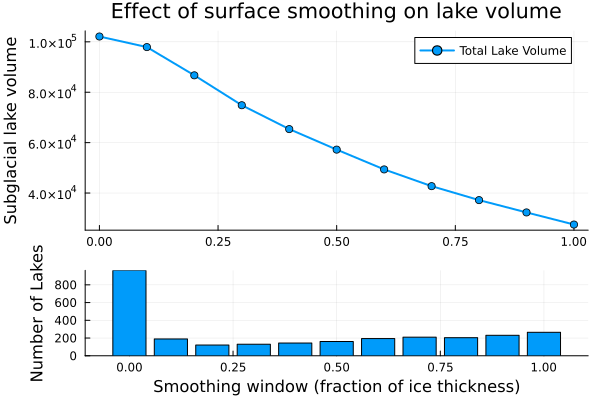

In [29]:
ice_fractions = results.ice_fraction
lake_volumes = results.sum_lake
nb_lakes = results.number_lakes

layout = @layout [a{0.7h}; b{0.3h}]
p1 = plot(ice_fractions, lake_volumes,
          marker=:circle,
          label="Total Lake Volume",
          xlabel="",
          ylabel="Subglacial lake volume",
          title="Effect of surface smoothing on lake volume",
          linewidth=2,
          legend=:topright)
p2 = bar(ice_fractions, nb_lakes,
          xlabel="Smoothing window (fraction of ice thickness)",
          ylabel="Number of Lakes",
          legend=false)

plot(p1, p2, layout=layout)

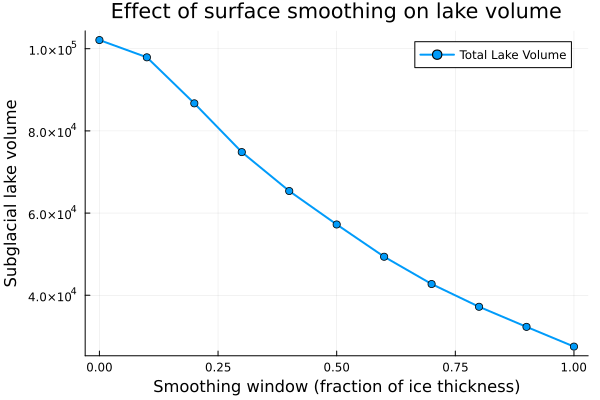

In [32]:
# Extract columns from DataFrame
ice_fractions = results.ice_fraction
lake_volumes = results.sum_lake
lake_volumes_inf1m = results.sum_lake_inf1m  # Assuming this column exists in `results`
lake_volumes_inf50cm = results.sum_lake_inf50cm 
nb_lakes = results.number_lakes

# Create the plot for total lake volumes (primary y-axis)
p = plot(ice_fractions, lake_volumes, marker=:circle, label="Total Lake Volume", xlabel="Smoothing window (fraction of ice thickness)",
         ylabel="Subglacial lake volume", title="Effect of surface smoothing on lake volume", linewidth=2, legend=:topright)

# Now manually add the second axis for lake_volumes_inf1m
#plot!(p, ice_fractions, lake_volumes_inf1m, marker=:square, label="Lake Volume under 1m depth", linewidth=2, color=:red)
# Display the plot
display(p)


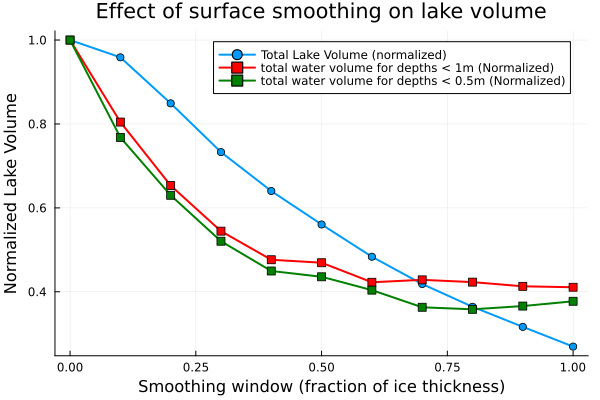

In [33]:
# Normalize the data
lake_volumes_normalized = lake_volumes ./ maximum(lake_volumes)
lake_volumes_inf1m_normalized = lake_volumes_inf1m ./ maximum(lake_volumes_inf1m)
lake_volumes_inf50cm_normalized = lake_volumes_inf50cm ./ maximum(lake_volumes_inf50cm)

# Create the plot for normalized lake volumes (both series)
p = plot(ice_fractions, lake_volumes_normalized, marker=:circle, label="Total Lake Volume (normalized)", xlabel="Smoothing window (fraction of ice thickness)",
         ylabel="Normalized Lake Volume", title="Effect of surface smoothing on lake volume", linewidth=2, legend=:topright)

# Add the normalized lake_volumes_inf1m series to the plot
plot!(p, ice_fractions, lake_volumes_inf1m_normalized, marker=:square, label="total water volume for depths < 1m (Normalized)", linewidth=2, color=:red)
# Add the normalized lake_volumes_inf1m series to the plot
plot!(p, ice_fractions, lake_volumes_inf50cm_normalized, marker=:square, label="total water volume for depths < 0.5m (Normalized)", linewidth=2, color=:green)

# Display the plot
display(p)

## Smooth surface ##

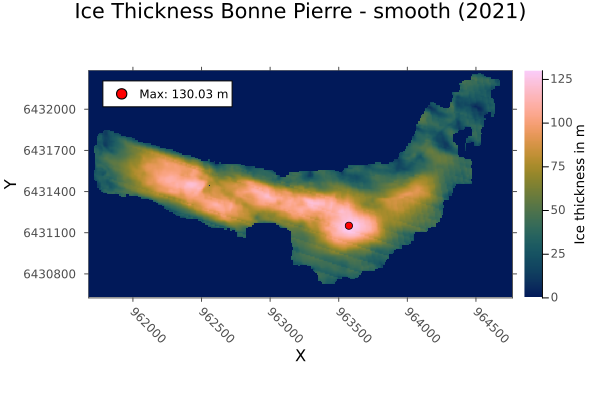

In [16]:
# smooth surface
x,y = dims(surface_2021_cr)
y = x #a trick as WWFS.smooth_surface test: @assert dy==dx and here dy = -1 (dx=1)
ice_fractio = 0.25 # %  is the fraction of ice thickness over which to average (in the +/- sense).  So goes from 0 to infinity. Probably 0.5 is good
minwindow = 20 #m, minimal window
surface_2021_smooth = WWFS.smooth_surface(x,y,surface_2021_cr, bed_resamp, ice_fractio, mask);

#smooth ice thickness too
ice_thickness_2021_smooth = surface_2021_smooth .- bed_resamp
ice_thickness_2021_smooth[isnan.(ice_thickness_2021_smooth)] .= 0
ice_thickness_2021_smooth[ice_thickness_2021_smooth .< 0] .= 0

# Find max value and its index
max_value = maximum(ice_thickness_2021_smooth)
max_index = argmax(ice_thickness_2021_smooth)  # Returns linear index
x,y = dims(ice_thickness_2021_smooth)
x_max, y_max = x[max_index[1]],y[max_index[2]]

Plots.heatmap(ice_thickness_2021_smooth,title="Ice Thickness Bonne Pierre - smooth (2021)",colorbar_title="Ice thickness in m") 
scatter!([x_max],[y_max], color=:red, markersize=4,label="Max: $(round(max_value, digits=2)) m")


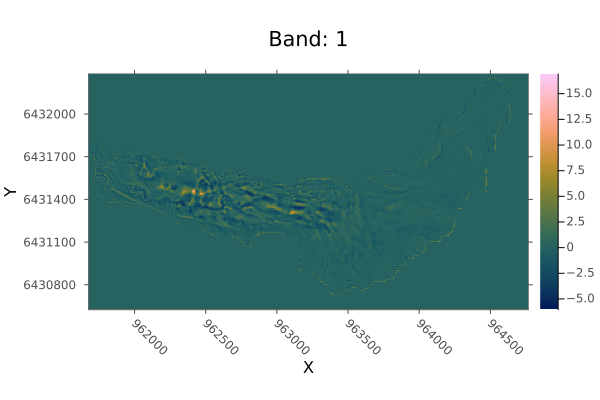

In [35]:
heatmap(surface_2021_cr .- surface_2021_smooth)
#heatmap(ice_thickness_2021_smooth .- ice_thickness_2021)


In [36]:
maximum(ice_thickness_2024)

124.980835f0

### Fill lakes at glacier surface 

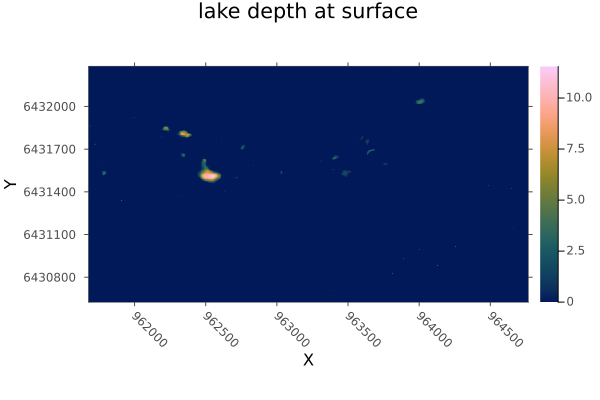

In [37]:
area, slen, dir, nout, nin, sinks, pits, c, bnds = WWF.waterflows(surface_2021_smooth);
#plt_area(area, pits)
demf = fill_dem(surface_2021_smooth, sinks, dir)
# "lake-depth"
lake_surface = demf.-surface_2021_smooth
heatmap(lake_surface,title="lake depth at surface")
#sum(lake_surface[.!isnan.(lake_surface) .&& mask])

In [38]:
maximum(lake_surface[.!isnan.(lake_surface) .&& mask])

11.595459f0

In [39]:
surface_2021_filled = surface_2021_smooth .+ 0.75*lake_surface;

## get cell size for WWFS
x,y = dims(surface_2021_cr)
dx = step(dims(surface_2021_cr)[1])

#surface 2021 with surface lakes filled
(_, _, _, _, _, _, _, _),
         (_, _, _, _),
         (_, lakes_free_surf_2021_filled),
         _ = WWFS.waterflows_subglacial(surface_2021_filled, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);

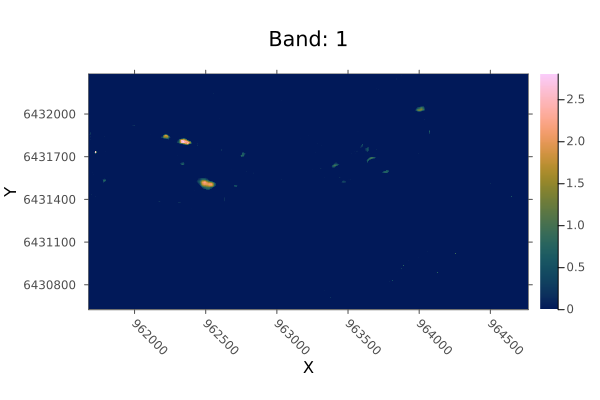

In [40]:
heatmap(lakes_free_surf_2021_filled)


In [41]:
sum(lakes_free_surf_2021_filled[.!isnan.(lakes_free_surf_2021_filled) .&& mask])

9837.453356495282

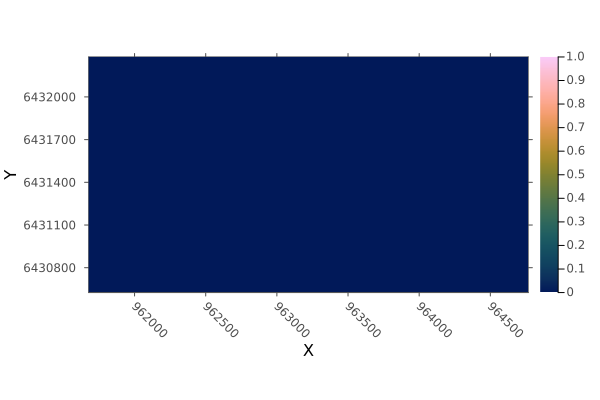

In [42]:
# A single catchment of some point.  Choose one with large catchment:
i, j = max_index[1],max_index[2]
cc = catchment(dir, CartesianIndex(i,j))
heatmap(cc)
#scatter!(x[i], y[j], markersize=50)

In [43]:
replace_missing(bed, NaN)
missingval(bed_resamp)

-9999.0f0

In [44]:
maximum(ice_thickness_2021[mask])

133.17554f0

In [45]:
#mosaic(first,surface_2021_cr; to=bed_resamp)

## Water routing for 2021/2024 ice surface ##

In [17]:

# 2021

## get cell size for WWFS
x,y = dims(surface_2021_cr)
dx = step(dims(surface_2021_cr)[1])

# Gamma is the Rothlisberger constant. [1] is without gamma, [2] is gamma=WWFS.GAMMA = -0.31 (Rothlisberger constant = stream deflection)

#surface 2021
(area_2021, slen_2021, dir, nout, nin, pits, c, bnds),
         (sc_locs, kappas, diro, phi_2021),
         (lakes, lakes_free_surf_2021),
         sinkout = WWFS.waterflows_subglacial(surface_2021_cr, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);


#surface smooth 2021
(area_2021_smooth, slen_2021_smooth, dir, nout, nin, pits, c, bnds),
         (sc_locs, kappas, diro, phi_2021_smooth),
         (lakes, lakes_free_surf_2021_smooth),
         sinkout = WWFS.waterflows_subglacial(surface_2021_smooth, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);







         

In [47]:
length(pits)

9554

In [48]:
# 2024


#surface 2024
(area_2024, slen_2024, dir, nout, nin, pits, c, bnds),
(sc_locs, kappas, diro, phi_2024),
(lakes, lakes_free_surf_2024),
sinkout = WWFS.waterflows_subglacial(surface_2021_cr .- ice_thickness_diff, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);

#area -- upslope area, tuple containing: total flux (m3/s), extra flux (m3/s), dissipation-melt-rate (m/s), pressure-melt-rate (m/s)

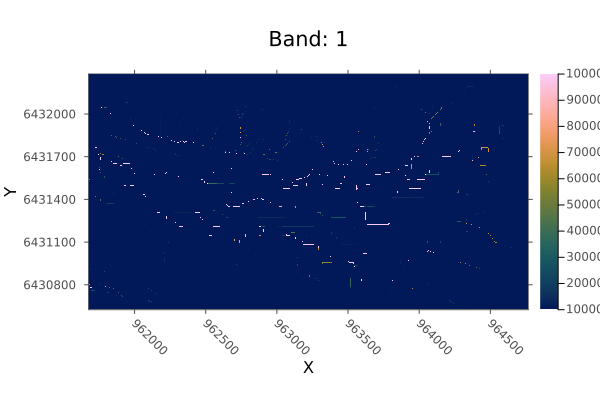

In [49]:
heatmap(area_2024[1],clims=(1e4,1e5))





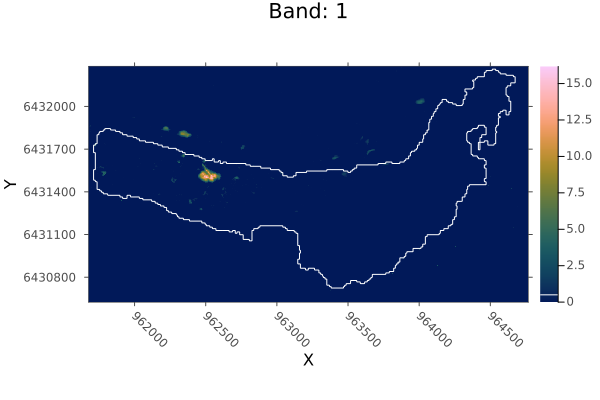

In [50]:
Plots.heatmap(lakes_free_surf_2021,title="lakes free surface 2021")
Plots.contour!(mask, color=:white,levels=[0.5]) 


## How many lakes? Which distribution?

In [18]:
mask_lakes = lakes_free_surf_2021_smooth .> 0;
#heatmap(mask_lakes)
#Plots.contour!(mask, color=:white,levels=[0.5]) 

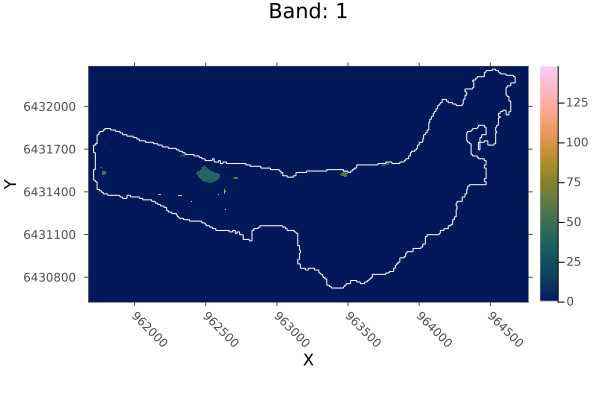

In [19]:
using Images


mask_lakes = (lakes_free_surf_2021_smooth .> 0) .& (ice_thickness_2021 .> 0)
# Assume 'binary_image' is a 2D array of Bool values representing the binary image
labeled_image = Images.label_components(mask_lakes)
heatmap(labeled_image)
Plots.contour!(mask, color=:white,levels=[0.5]) 
#maximum(labeled_image)

In [53]:
# to characterize individual lakes: use labeled images as a mask (labeled_image .> 1 to maximum(labeled_image) and apply lakes_depth ratser to each of this mask.)

In [20]:
using ImageComponentAnalysis

# Analyze components to get their properties
measurements = analyze_components(labeled_image, BasicMeasurement())
# Sort the measurements DataFrame by area in descending order
sorted_measurements = sort(measurements, :area, rev=true) # area in is pixel counts !

Row,l,Q₀,Q₁,Q₂,Q₃,Q₄,Qₓ,area,perimeter₀,perimeter₁
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Float64,Float64,Int64
1,39,5111065,214,170,210,11561,0,11883.2,469.813,594
2,55,5121662,45,90,41,1382,0,1474.12,150.811,176
3,37,5122350,37,96,33,704,0,790.125,145.497,166
4,54,5122367,42,58,38,715,0,787.75,114.569,138
5,24,5122404,39,58,35,684,0,753.375,110.326,132
6,59,5122614,32,58,28,488,0,549.5,100.426,118
7,102,5122720,32,50,28,390,0,447.5,92.4264,110
8,18,5122913,17,54,13,223,0,265.625,75.2132,84
9,118,5122929,27,42,23,199,0,246.875,77.3553,92


In [ ]:
# Initialize an array to store lake volumes
lake_volumes = Float64[]

# Iterate over each label to compute the volume
for label in 1:maximum(labeled_image)
    # Create a mask for the current label
    mask_current = labeled_image .== label

    # Sum the values in lakes_free_surf_2021 corresponding to the current mask
    volume = sum(lakes_free_surf_2021[mask_current]) *dx *dx  # in m3

    # Append the volume to the array
    push!(lake_volumes, volume)
end

# Convert the lake_volumes array to a DataFrame for further analysis
lake_volumes_df = DataFrame(volume = lake_volumes);


## Incoporate this in the smoothing assessment loop :) So you get a lake volume distribution for each snoothing increment 


In [30]:
# boxplot
using StatsPlots
using StatsBase
# Assuming lake_volumes_df is your DataFrame with a :volume column
@df lake_volumes_df boxplot(:volume;
    ylabel = "Lake Volume",
    title = "Distribution of Lake Volumes",
    notch = false,
    outliers = true)

mean(lake_volumes)
spread = StatsBase.iqr(lake_volumes)


0.511360168498868

In [104]:
mask_biggest = labeled_image .== sorted_measurements[1,1]
sum(lakes_free_surf_2021[mask_biggest])


81351.56209660854

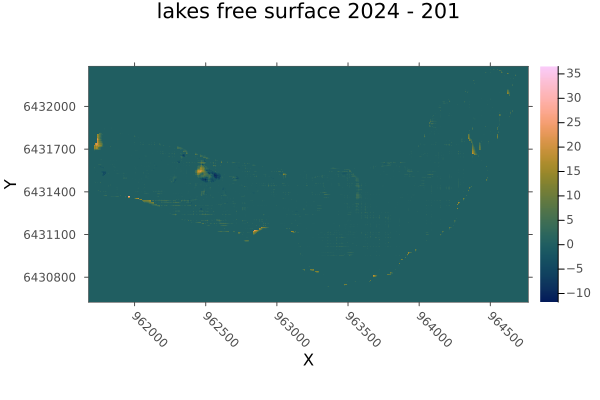

In [35]:
Plots.heatmap(lakes_free_surf_2024-lakes_free_surf_2021,title="lakes free surface 2024 - 201")

In [36]:
sum(lakes_free_surf_2021_smooth[.!isnan.(lakes_free_surf_2021_smooth) .&& mask])

57225.90123410281

In [37]:
sum(lakes_free_surf_2021[.!isnan.(lakes_free_surf_2021) .&& mask])

102105.47861073697

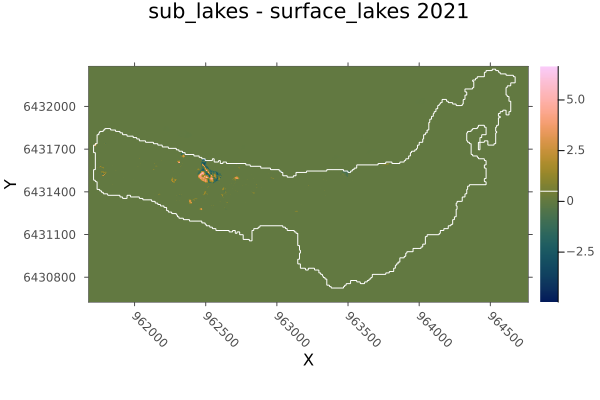

In [38]:
Plots.heatmap(lakes_free_surf_2021 - lake_surface)
contour!(mask, color=:white,levels=[0.5],
title="sub_lakes - surface_lakes 2021")  

In [39]:
# volume for all hydraulic barrier
vol_cum_lakes_2021_smooth = sum(filter(!isnan, lakes_free_surf_2021_smooth[mask])) * dx * dx
vol_cum_lakes_2021 = sum(filter(!isnan, lakes_free_surf_2021[mask])) * dx * dx
#vol_cum_lakes_2024 = sum(filter(!isnan, lakes_free_surf_2024[mask])) * dx * dx
vol_cum_lakes_2021


102105.47861073697

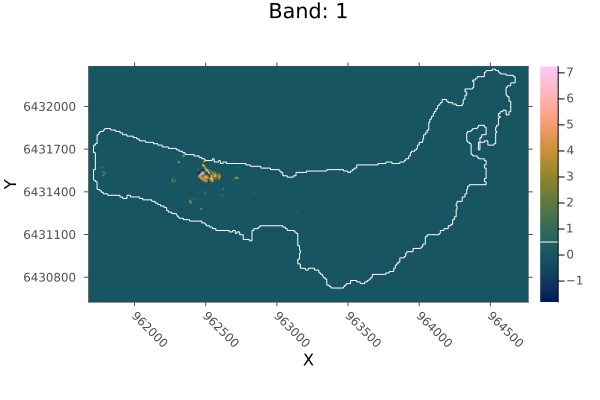

In [41]:
Plots.heatmap(lakes_free_surf_2021 .- lakes_free_surf_2021_smooth)
contour!(mask, color=:white,levels=[0.5])

## Write outputs .TIF ##

In [ ]:
write(joinpath(datadir_out,"Bedrock_resampled_1m.tif"),bed_resamp,force=true);

In [ ]:
#WRITE
write(joinpath(datadir_out,"lakes_free_surf_2021_BP.tif"),lakes_free_surf_2021,force=true);
write(joinpath(datadir_out,"lakes_free_surf_2021_BP_smooth.tif"),lakes_free_surf_2021_smooth,force=true);
write(joinpath(datadir_out,"phi_2021_BP.tif"),phi_2021,force=true);
write(joinpath(datadir_out,"lakes_free_surf_2024_BP.tif"),lakes_free_surf_2024,force=true);
write(joinpath(datadir_out,"phi_2024_BP.tif"),phi_2024,force=true);
write(joinpath(datadir_out,"area_2024_BP.tif"),area_2024[1],force=true);  
write(joinpath(datadir_out,"area_2021_BP.tif"),area_2021[1],force=true);
write(joinpath(datadir_out,"area_2021_BP_smooth.tif"),area_2021_smooth[1],force=true);




In [ ]:

mask_BP = Raster(mask, (x,y))
write(joinpath(datadir_out,"mask_BP.tif"), mask_BP,force=true);

┌ Warning: `missing` cant be written with gdal, missinval for `Bool` of `false` used instead
└ @ Rasters /home/cogier/.julia/packages/Rasters/nC6xb/src/utils.jl:29


MethodError: MethodError: Cannot `convert` an object of type Type{Bool} to an object of type ArchGDAL.GDALDataType
The function `convert` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  convert(::Type{ArchGDAL.GDALDataType}, !Matched::Type{UInt32})
   @ ArchGDAL ~/.julia/packages/ArchGDAL/ujstt/src/utils.jl:142
  convert(::Type{ArchGDAL.GDALDataType}, !Matched::Type{UInt16})
   @ ArchGDAL ~/.julia/packages/ArchGDAL/ujstt/src/utils.jl:142
  convert(::Type{ArchGDAL.GDALDataType}, !Matched::Type{Int32})
   @ ArchGDAL ~/.julia/packages/ArchGDAL/ujstt/src/utils.jl:142
  ...


In [ ]:
x

X Projected{Float64} ForwardOrdered Regular DimensionalData.Dimensions.LookupArrays.Intervals{DimensionalData.Dimensions.LookupArrays.Start} crs: WellKnownText
wrapping: 3087-element LinRange{Float64, Int64}:
 961678.0, 961679.0, 961680.0, 961681.0, …, 964762.0, 964763.0, 964764.0

# Stochastic distribution #

questions: 

- how to define correlation length for dem? use variogramms?
- how to define pixel-based uncertaities in both surface and bed dems? 

ideas:
- Distangle the contribution of surf uncertainties and flotation fractio uncer: it seems that the major contributor in uncertainties is the assumption of the flotation fraction !


Uncertainties in GPR: Lambda in ice at 25Mhz is 6.72 meters. A standard vertical resolution estimation is lambda/4, thus 1.68m. That means object should be separated of at least 1.68m to be visible, it does not say something about the uncertainties of the picked reflection.

For the picking uncertainty, Rutishauser and others (2016) estimated an uncertainty of ±5 m.

In [ ]:
### Stochastic

# input parameters

surfdem = surface_2021_smooth
beddem = surface_2021_cr .- ice_thickness_2021   # ice_thickness_2021 = surface_2021_cr .- bed_resamp
x,y = dims(surface_2021_cr)
mask_stoch = surface_2021_cr .> 0   # we don't mask the routing, to mirror the deterministic method


kernel = "gauss" # or exponential
range_surf = 400
range_bed = 250

if kernel == "gauss"
    cov_fn = [WWFS.GRF.gaussian_kernel, WWFS.GRF.exponential_kernel][1] 
    correlation_length_surf = range_surf / sqrt(3) # because we convert the range form variogram into a coorelation length for the covariance function
    correlation_length_bed = range_bed / sqrt(3)
elseif kernel == "expo"
    cov_fn = [WWFS.GRF.gaussian_kernel, WWFS.GRF.exponential_kernel][2] 
    correlation_length_surf = range_surf / 3 # because we convert the range form variogram into a coorelation length for the covariance function
    correlation_length_bed = range_bed / 3
end

surfdem_uc = Uncertainty(absuc=0.1, reluc=0, correlation_length=correlation_length_surf, covariance_fn=cov_fn)# absoute veersus relative unc. -> check L211 in Stochastic.jl
beddem_uc = Uncertainty(absuc=5, reluc=0, correlation_length=correlation_length_bed, covariance_fn=cov_fn)
floatfrac = 1 * ones(size(surfdem));
floatfrac_uc = Uncertainty(absuc=0, reluc=0, correlation_length=50, covariance_fn=cov_fn) #WWFS.GRF.gaussian_kernel)
waterinput = ones(size(surfdem));
waterinput_uc = Uncertainty()

ctch_sinks = [CartesianIndices((1:10, 1:length(y)))[:], CartesianIndices((1:10, 1:length(y)÷2))[:]]


model, get_sample, aggregate = WWFS.make_fns(step(x),
                                             surfdem, surfdem_uc,
                                             beddem, beddem_uc,
                                             floatfrac, floatfrac_uc,
                                             waterinput, waterinput_uc,
                                             ctch_sinks,
                                             mask_stoch)  
input, output = model(get_sample()...);
aggr = map_mc(model, get_sample, aggregate, 10)
#WWF.plt.plotarea(x, y, aggr.areas, pits)

# important: aggreagte set a minimal treshold for lake depth (which is hardcoded in WWFS) under which the lake depht is not counted/sum. 

Progress: 100%|█████████████████████████████████████████| Time: 0:01:02


(areas = Float32[1.0 1.0 … 1.0 1.0; 1.0 1.0000297 … 1.0000184 1.0; … ; 1.0 1.0000627 … 1.0000137 1.0; 1.0 1.0 … 1.0 1.0], areas_extra = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.00029744563 … 0.00018276801 0.0; … ; 0.0 0.0006260672 … 0.00013698384 0.0; 0.0 0.0 … 0.0 0.0], melt_freeze = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.00029744563 … 0.00018276801 0.0; … ; 0.0 0.0006260672 … 0.00013698384 0.0; 0.0 0.0 … 0.0 0.0], lakes_depth = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], lakes_mask = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], lakes_depth_fs = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], lakes_mask_fs = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], sc_locs = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], kappas = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0

In [159]:
function gaussian_kernel_1d(len, x)
    return exp.(-x.^2 ./ len^2)
end

function exponential_kernel_1d(len, x)
    return exp.(-abs.(x) ./ len)
end

#inspired from grf.jl:
#function gaussian_kernel(nx, ny, len)
#    D = distance_squared(nx, ny)
#    return exp.(-D / len^2)
#end

exponential_kernel_1d (generic function with 4 methods)

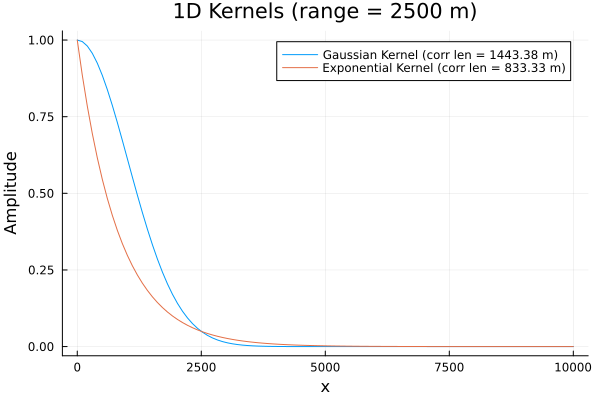

In [160]:

# Define the range of x values for plotting
x = range(0, 10000, length=100)

# Define the correlation length
range_vario = 2500
len_g = range_vario / sqrt(3)
len_e = range_vario / 3   # see cell below on how to "convert" the practical range (from variograms) in the correlation length for gaussian

# Compute the kernel values
gaussian_values = gaussian_kernel_1d(len_g, x)
exponential_values = exponential_kernel_1d(len_e, x)

# Plot the kernels
plot(x, gaussian_values, label="Gaussian Kernel (corr len = $(round(len_g, digits=2)) m)", xlabel="x", ylabel="Amplitude", title="1D Kernels (range = $range_vario m)")
plot!(x, exponential_values, label="Exponential Kernel (corr len = $(round(len_e, digits=2)) m)")




The correlation length in a Gaussian kernel controls the scale of spatial influence. A smaller correlation length results in a narrow kernel where only nearby points are significantly correlated, while a larger correlation length produces a wider kernel with broader spatial correlation.
The correlation is approximately 60.65% of its maximum value at a distance equal to the correlation length.

chatgpt: For models where the variogram approaches the sill asymptotically, the practical range is defined as the distance at which the variogram reaches 95% of the sill. This practical range relates to the correlation length as follows:​


    Exponential Model: Practical range ≈ 3 x ℓ​

    Gaussian Model: Practical range ≈ sqrt(3) x ℓ​ = 1.73 x l

In [161]:
typeof(aggr)
fieldnames(typeof(aggr))

(:areas, :areas_extra, :melt_freeze, :lakes_depth, :lakes_mask, :lakes_depth_fs, :lakes_mask_fs, :sc_locs, :kappas, :catchments, :catchment_fluxes, :n_samples)

In [195]:
aggr.n_samples

Base.RefValue{Int64}(10)

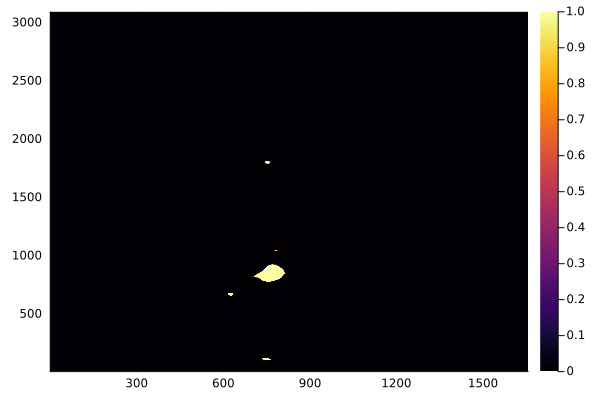

In [162]:
heatmap(aggr.lakes_mask)

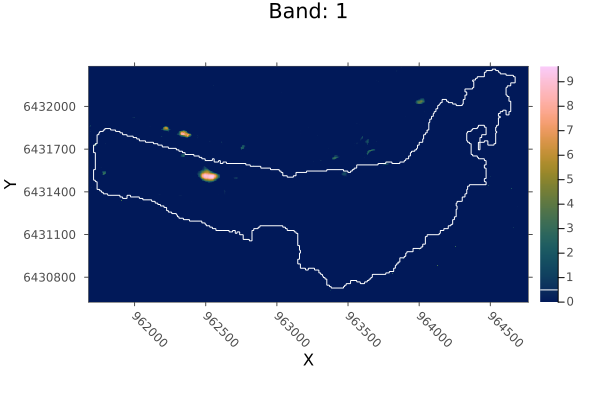

In [178]:

aggr_lakes_fs = Raster(aggr.lakes_depth_fs, (x,y))
heatmap(aggr_lakes_fs)
Plots.contour!(mask, color=:white,levels=[0.5]) 



In [192]:
sum(aggr_lakes_fs[.!isnan.(aggr_lakes_fs) .&& mask]) * (dx * dx)

# f=0,uc_surf=10cm,uc_gpr=5m (corr len 1000),corr_len = 100m: sum_lake_fs=102'000
# f=0,uc_surf=10cm,uc_gpr=1m,corr_len = 100m: sum_lake_fs=101'000  --> the uc on bed and surface don't change "too much" on the stochastic sum
# f=0.1,uc_surf=10cm,uc_gpr=1m,corr_len = 100m: sum_lake_fs=640'000  --> the flotation fractio matters a lot!



57363.66015625

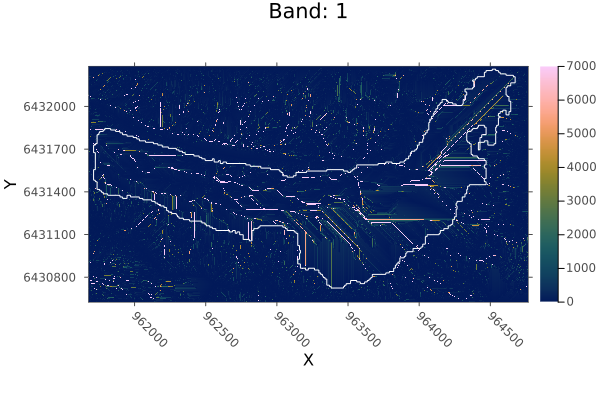

In [180]:

aggr_area = Raster(aggr.areas, (x,y))
heatmap(aggr_area)
Plots.contour!(mask, color=:white,levels=[0.5],clims=(0,7000)) 


In [181]:
aggr_lakes[isnan.(aggr_lakes)] .= 0
A = (dims(aggr_lakes)[1][2] - dims(aggr_lakes)[1][1])^2
sum(aggr_lakes.*mask)*A


LoadError: UndefVarError: `aggr_lakes` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [ ]:
# look at threshold (maybe a proxy for smoothing sensitivity?) --> ok
# look at odd values/units in lakes aggregated --> ok


Hydrological and Geomorphological Outputs

    area_2024 – The surface area of a feature (e.g., a water pocket, lake, or hydrological network) in 2024. Likely measured in square meters or kilometers.

    slen_2024 – Stream or flow path length in 2024, possibly representing a drainage path or subsurface channel length. Likely measured in meters or kilometers.

    dir – Flow direction, usually represented as an integer grid (e.g., D8 flow direction scheme) indicating where water is flowing on the surface or subsurface.

    nout – The number of outflows from a given feature or drainage system (e.g., number of exits from a water body).

    nin – The number of inflows into a feature (e.g., number of sources feeding into a lake, subsurface flow, or drainage network).

    pits – Locations of hydrological depressions or sinks in the terrain where water can accumulate (e.g., crevasses, bed depressions).

    c – Likely a connectivity parameter, possibly indicating connected water pathways or networks.

    bnds – Boundaries of the modeled area, lakes, or hydrological domains (e.g., polygon edges of a lake or glacier boundary).

Subsurface and Glacier Hydrology Outputs

    sc_locs – Locations of subglacial conduits or hydrological features (e.g., inferred locations of drainage paths under the glacier).

    kappas – Hydraulic conductivity or permeability values (related to water flow through porous media or subglacial sediments).

    diro – Outflow direction, possibly indicating the direction of water exiting the system.

    phi_2024 – Hydraulic potential in 2024, likely representing the energy available to drive water flow (related to ice overburden pressure and water pressure).

Lake and Water Pocket Outputs

    lakes – Locations and extents of lakes or water pockets (e.g., supraglacial or subglacial lakes).

    lakes_free_surf_2024 – Surface area of lakes that have a free water surface (i.e., not entirely enclosed by ice) in 2024.

Water Sink & Routing Outputs

    sinkout – Possibly the outflow points of sinks or water pockets, where water exits the system (e.g., locations where drainage occurs, such as crevasses or subglacial outflows).